# Analisis Data Menggunakan Tools KNIME

KNIME merupakan sebuah tools analisis data yang sering digunakan oleh Data Analyst. Dengan KNIME, para pengguna dapat dengan mudah mengolah data, membuat model prediksi, serta visualisasi hasil analisis data. Dengan menggunakan KNIME, kita dapat belajar mengenai komsep dasar dalam data science secara praktis.KNIME juga memberikan fleksibilitas bagi penggunanya untuk menggabungkan beberapa algoritma analisis data sehingga memudahkan dalam pembuatan workflow analisis yang kompleks.   

## Proses Analisis data E-Coli Menggunakan Tools KNIME

### Tools yang harus dipersiapkan

Beberapa tools yang harus dipersiapkan dalam analisis menggunakan KNIME yakni:
1. KNIME Tools
  - Tools KNIME dapat diunduh melalui sites https://www.knime.com/downloads.
  - Kemudian isi data diri yang disiapkan oleh KNIME sebelum menginstall toolsnya.
  - Pilih versi atau bentuk installasi dari tools KNIME yang akan didownload.
  - Setelah berhasil mengunduh, install setup installasi dengan mengikuti setiap proses yang telah disediakan.

2. JDK PostgreSQL
 - Kunjungi sites https://jdbc.postgresql.org/download/ dan pilih versi JDK yang terbaru.
 - Install JDK Postgre yang nantinya digunakan untuk mengkoneksikan database Postgre yang dieksekusi di tools KNIME.

3. Miniforge
 - Kunjungi sites https://github.com/conda-forge/miniforge/tree/main.
 - Pilih versi Miniforg yang sesuai dengan kapatibilitas dari device.
 - Kemudian Install setup dan ikuti seluruh instruksi installasi yang sudah diatur oleh pihak Miniforge.

### Membuat Environment baru pada Miniforge

Environment yang dibuat akan digunakan untuk sebagai lingkungan untuk menjalankan script Python pada tools KNIME.

#### Langkah-Langkah Membuat Environment Baru pada Miniforge

1. Buka Miniforge Prompt, Miniforge Prompt dapat digunakan atau berada dalam device kita ketika telah menginstall-nya.


2. Buat Environment dengan cara memasukkan perintah ```conda create -n nama_env python=versi Python```

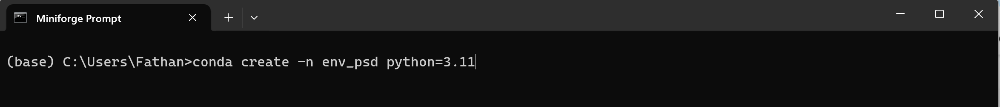


3. Apabila telah berhasil membuat Environment baru maka aktifkan dengan cara memasukkan perintah ```conda activate nama_env```



4. Kemudian install library yang diperlukan untuk analisis seperti "scikit-learn", "pandas", dan "numpy" dengan meemasukkan perintah ```pip install scikit-learn pandas numpy```

5. Tunggu hingga proses installasi selesai.

### Memulai Membuat Project dan Analisis Data Pada Tools KNIME

#### Membuat Project Baru pada Tools KNIME

Langkah-langkah membuat project baru:


1. Buka Tools KNIME yang telah terinstall. Pada halaman utama, pilih "Local Space" untuk membuat project baru.

2. Kemudian klik tombol tambah untuk membuat project dan memberi nama pada projectnya.

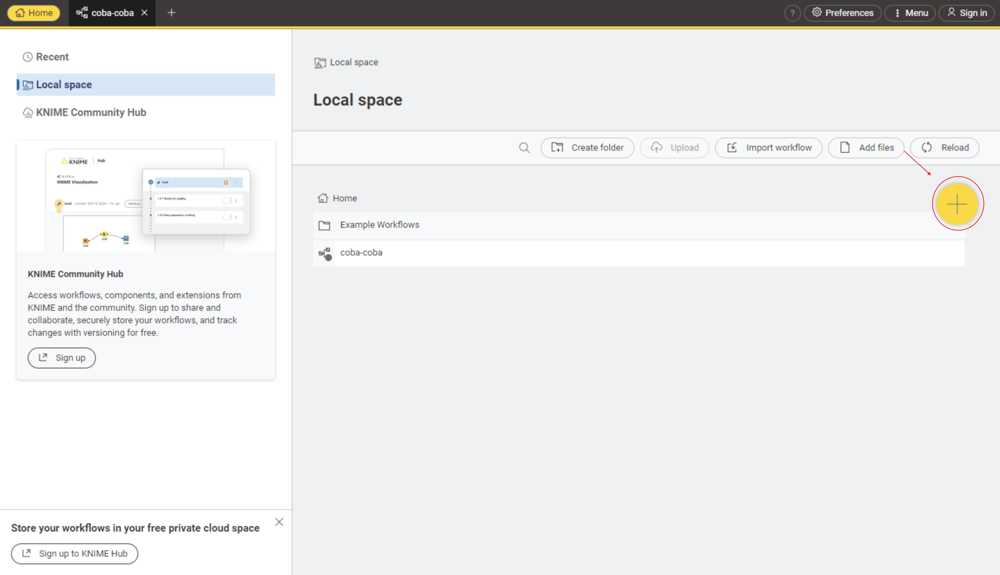

3. Setelah memasukkan nama project, klik tombol "create" untuk membuat project.

4. Berikut merupakan tampilan awal ketika berhasil membuat project baru.
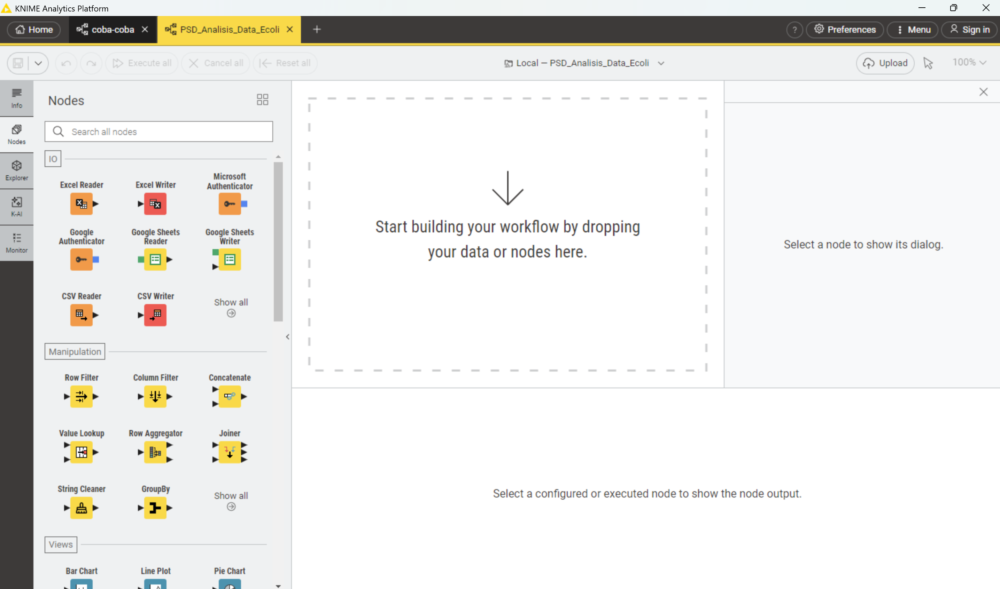

###

#### Mengkoneksikan data dari database PostgreSQL

##### Mengimport JDBC Postgre

Langkah-langkah memasukkan deiver JDBC Postgre:

1. Tambahkan JDBC Postgre yang sudah terinstall pada menu Preferences -> Databases.

Berikut memrupakan tampilan menu untuk menambahkan JDBC:
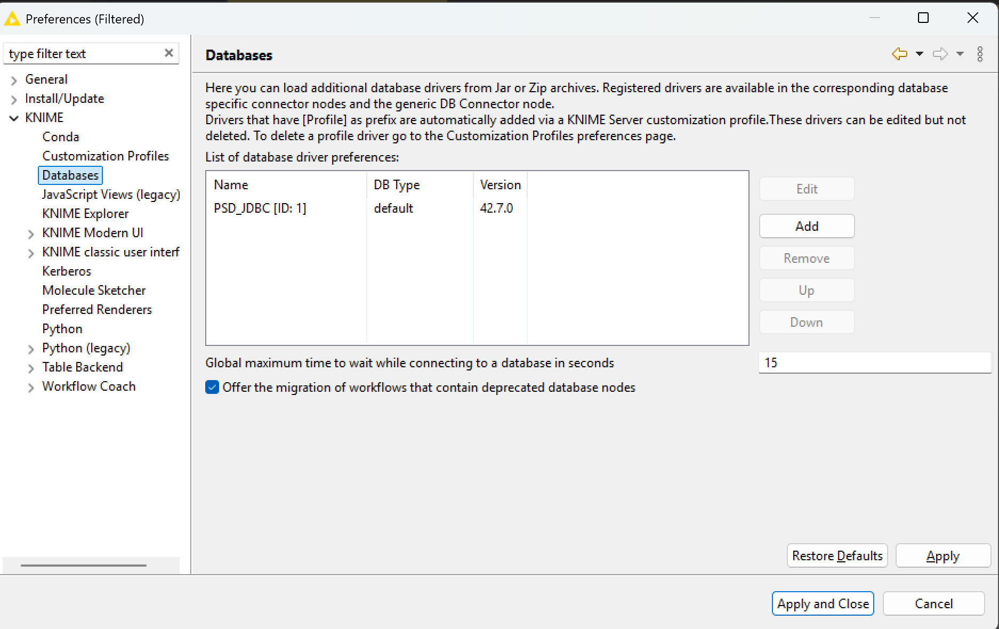

2. Untuk menambahkan, pilih tombol "add" kemudian isi form pengisian untuk detail drivernya dan import driver JDBC yang digunakan pada tombol "add file". Kemudian Pilih tombol "Find driver classes" agar KNIME otomatis menyesuaikan driver yang kita masukkan.

3. Klik "OK" untuk mengakhiri proses.

4. Pilih tombol "Apply" untuk menerapkan atau menyimpan driver JDBC yang telah ditambahkan.

##### Mengkoneksikan data dari database Local menggunakan Node

1. Pilih Node PostgreSQL Connector, karena kita menggunakan database Postgre. Kemudian drag menuju kolom workflow:

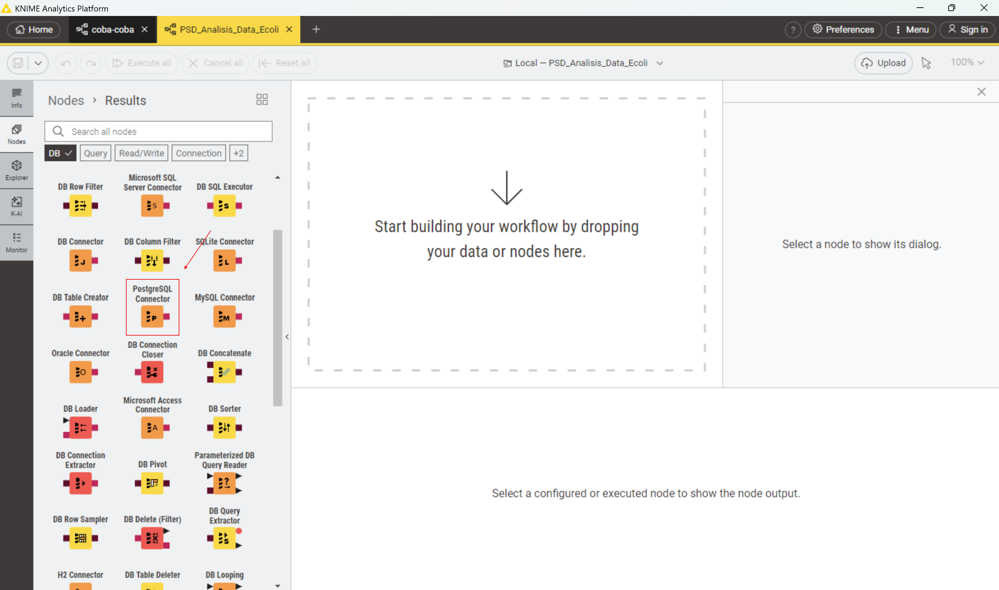

2. Kemudian klik dua kali node PostgreSQL dan masukkan kredensial dari database sebagai media untuk koneksi.

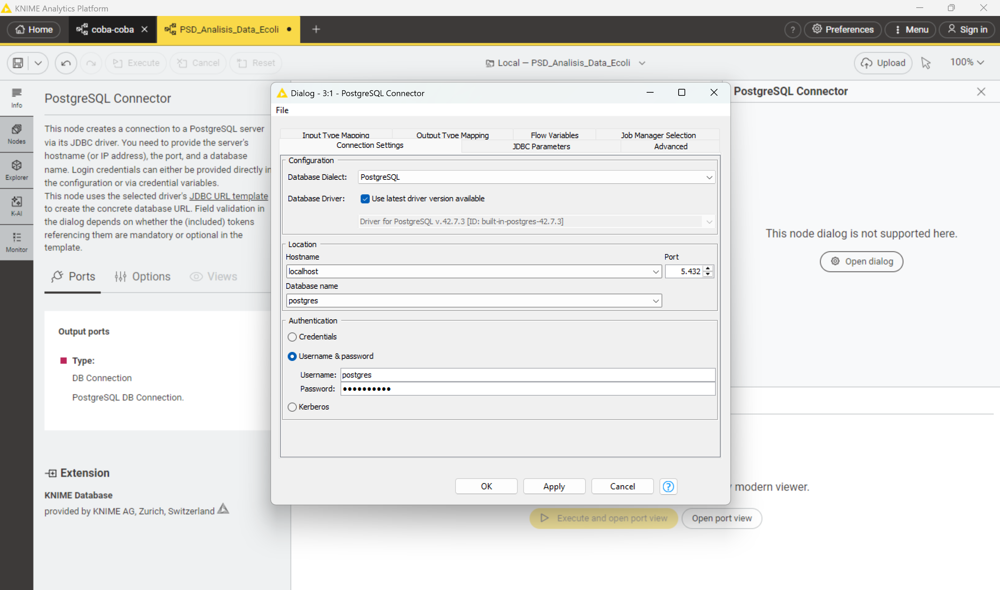

3. Kemudian klik Apply untuk menyimpan kredensial dari koneksi database nya.

4. Kemudian drag node "Table Selector" untuk memilih tabel yang akan ditampilkan seperti pada gambar di bawah ini dan klik "Apply" untuk menyimpannya:

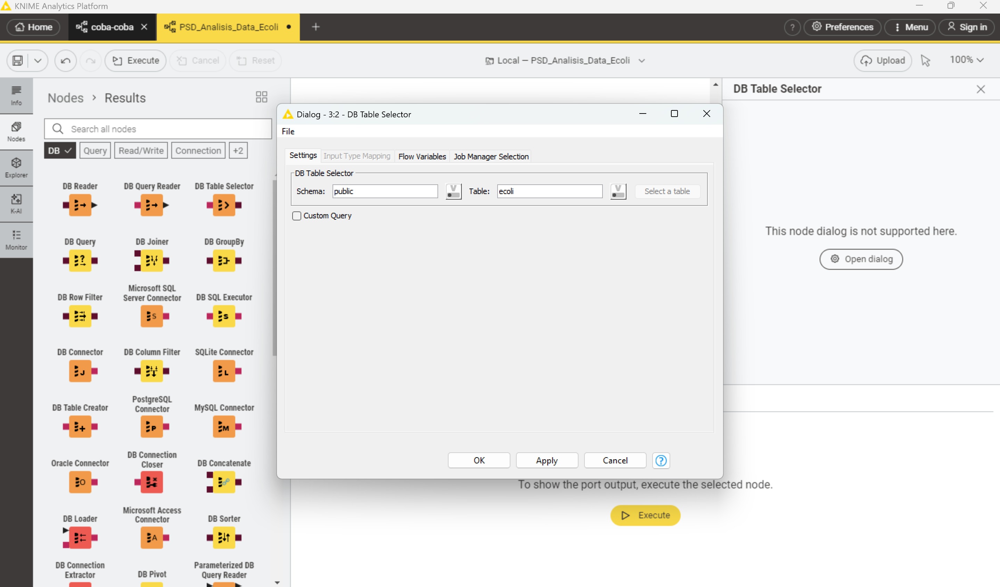

3. Tambahkan node "DB Reader" untuk membaca atau mengquery data yang sudah di query:

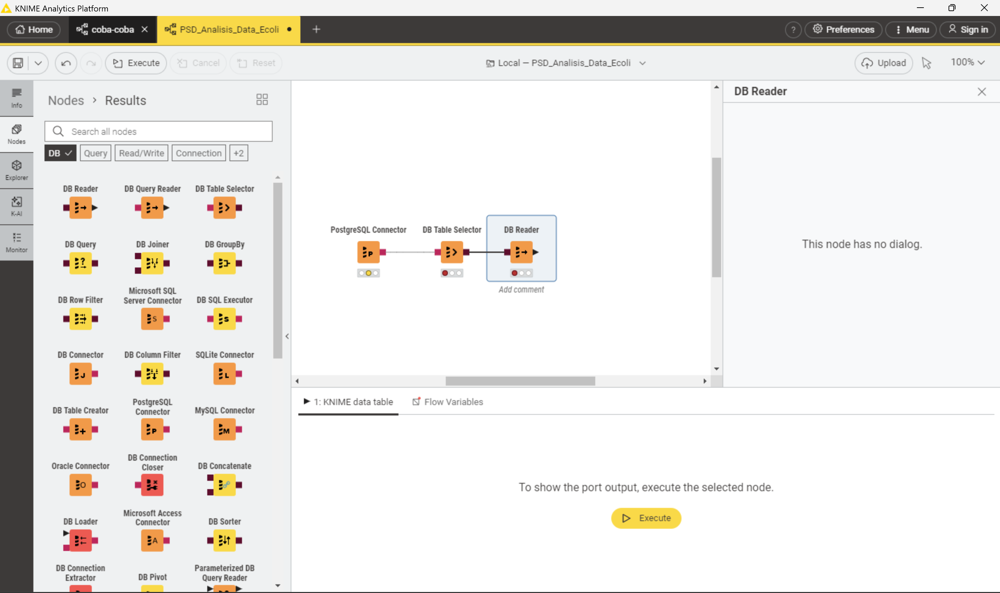

4. Jalankan node yang sudah di drag dengan menekan tombol play pada setiap node.
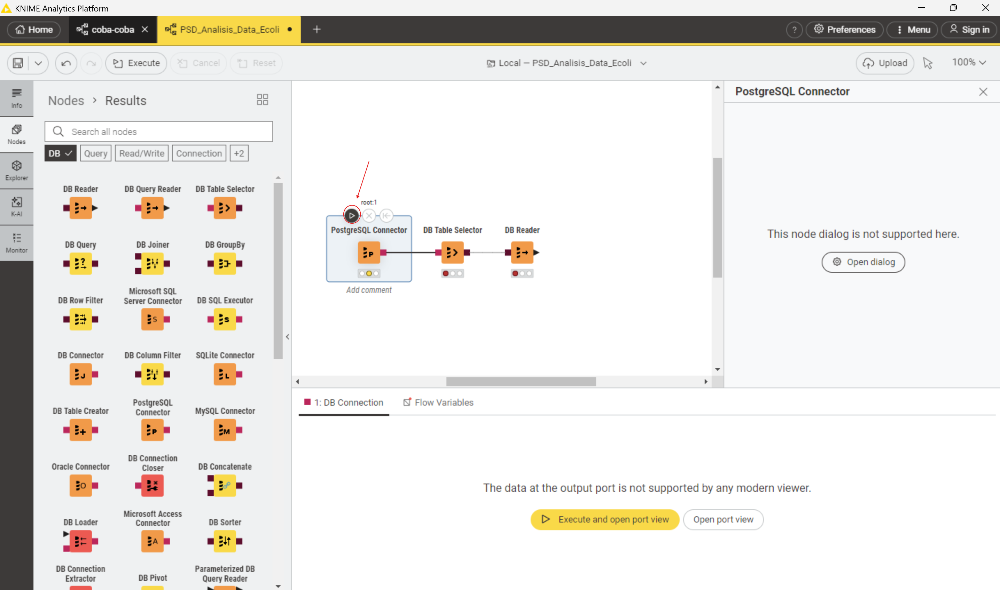

5. Berikut merupakan data yang berhasil di baca atau diquery dari database:
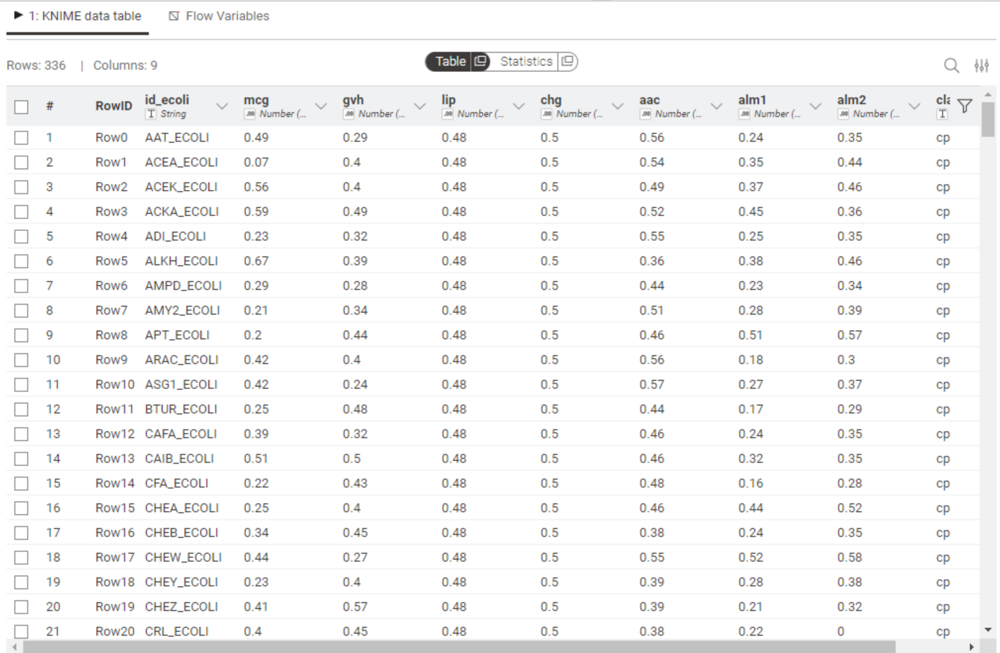

#### Outlier Detection Menggunakan Tools KNIME

1. Tambahkan Node Numeric Outlier, kemudian hubungkan dengan data yang telah di baca dari database.

2. Kemudian klik pada node Numeric Outlier dan pilih kolom include dengan mengeklik tombol "Enforce Inclusion".

Berikut merupakan tampilan setting untuk deteksi outliernya:
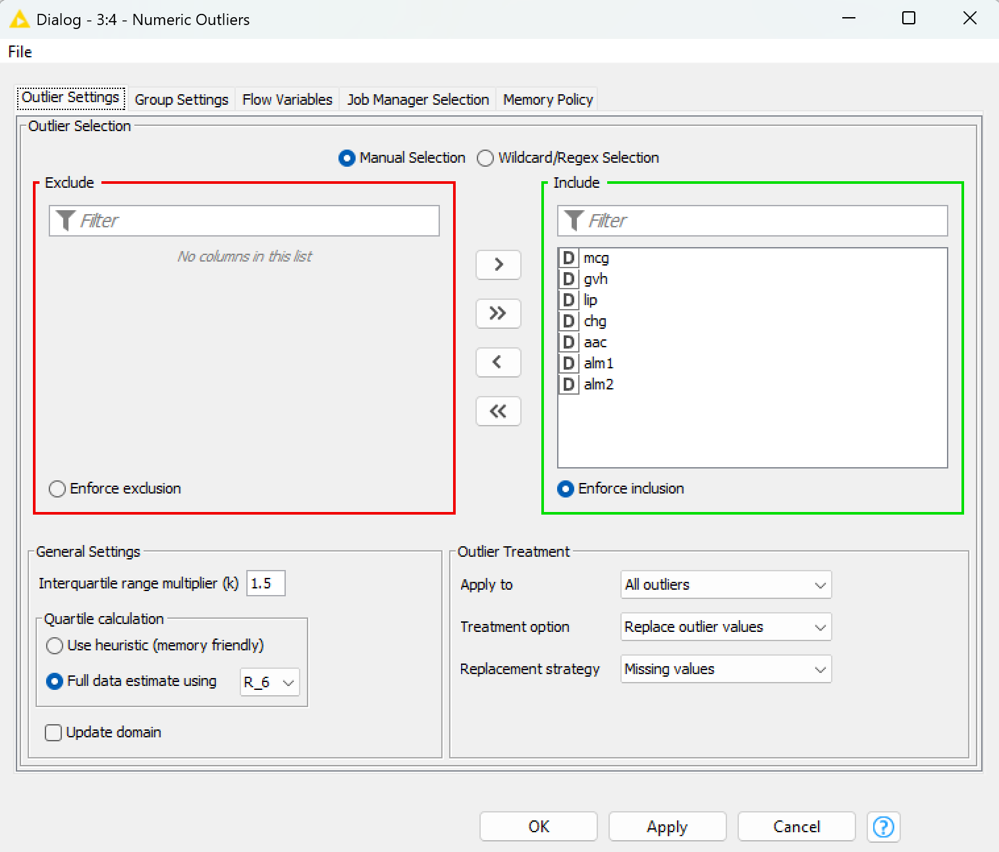

Jadi setiap kolom yang mengandung outlier maka nilainya akan dirubah menjadi missing value.

3. Tambahkan node Rule Engine untuk membedakan data yang mengandung outlier dengan data yang bukan outlier.


4. Klik kanan pada node Rule Engine kemudian masukkan script pada kolom ekspression ```MISSING $mcg$ OR MISSING $gvh$ OR MISSING $lip$ OR MISSING $chg$ OR MISSING $alm1$ OR MISSING $alm2$ OR MISSING $aac$ => "Outlier"
TRUE => "Normal"``` sebagai pembeda data outliernya.

5. Tambahkan node color manager untuk mengatur warna bagi data outlier dan bukan. Pilih menu "Color By" dan pilih kolom "Predicted".

6. Tambahkan node visualisasi scatter plot menggunkaan "scatter plot (Javascript) (Legacy). Kemudian centang "create image at output" pada konfigurasinya.

7. Hasil Visualisasi Data Outlier Ecoli
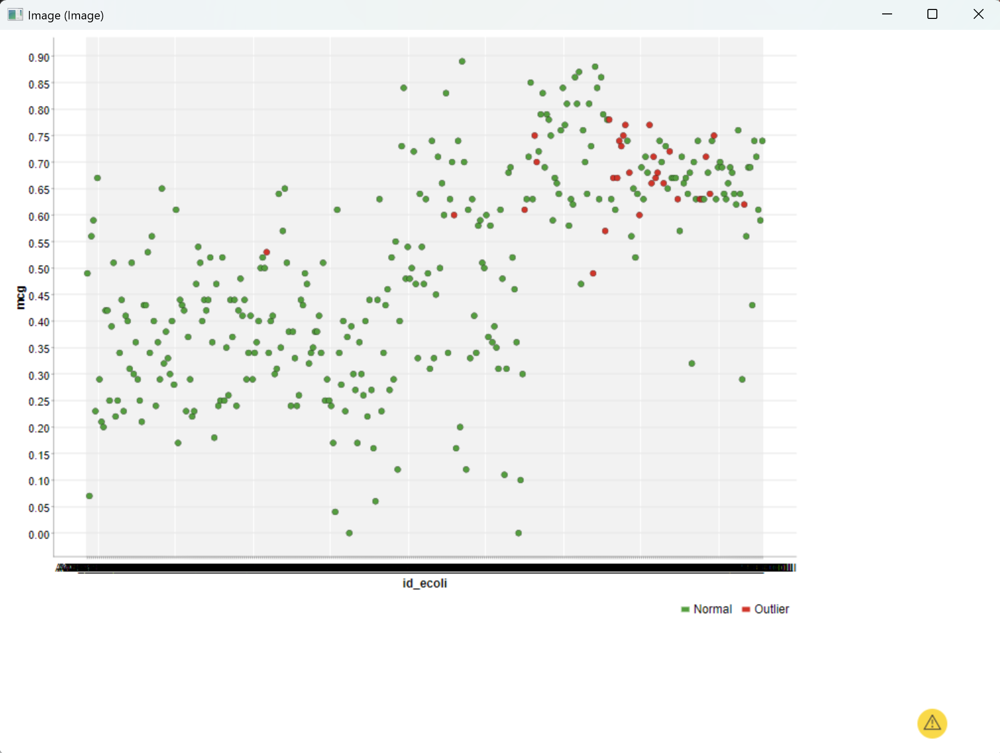

Urutan node deteksi Outlier:

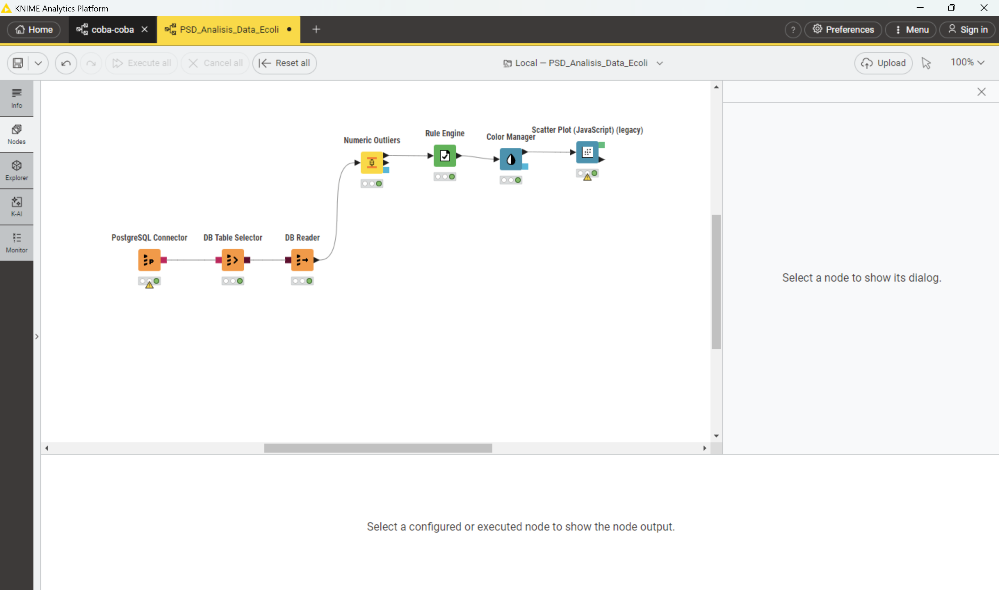

##### Menghapus Outlier

1. Tambahkan Node Row Filter yang terhubung dengan node Rule Engine

2. Atur untuk Filter yang berada pada navabar seperti gambar berikut:

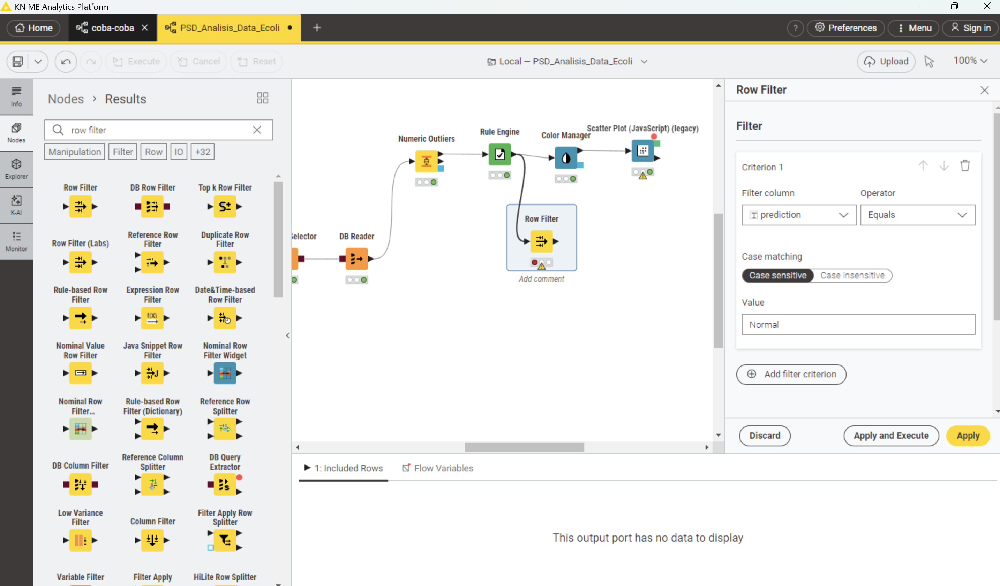

3. Kemudian klik "Apply" untuk menyimpan filter.

4. Tambahkan node Color Manager dan Scatter Plot seperti langkah sebelumnya untuk melakukan visualisasi dari data yang sudah bersih.

Berikut merupakan visualisasi data Ecoli yang telah dibersihkan:
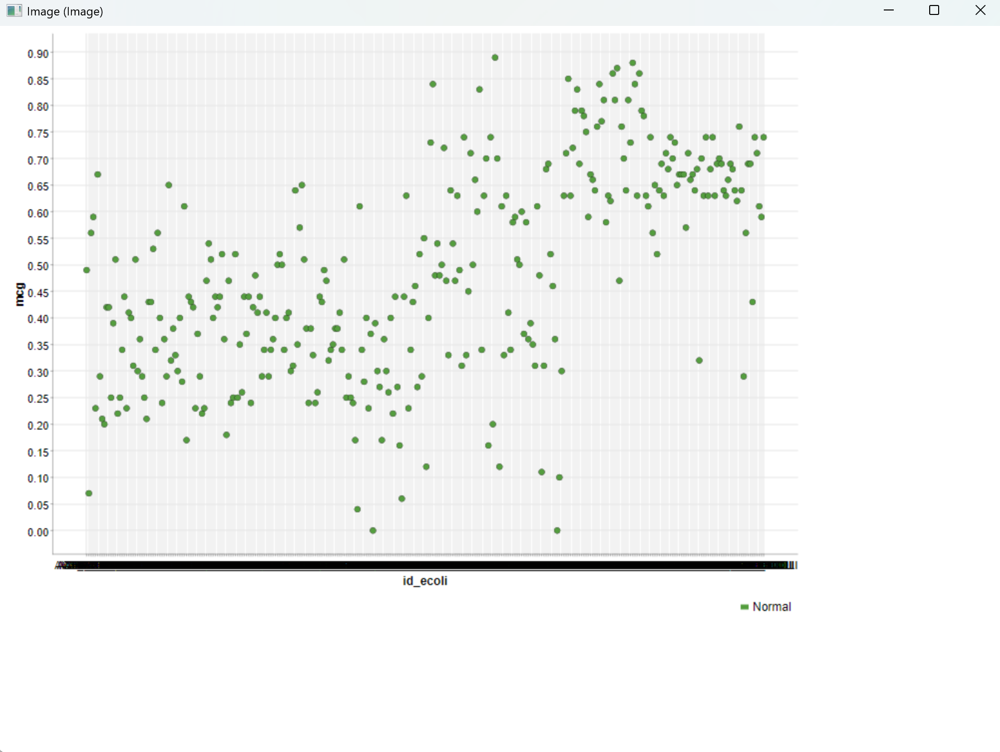

Berikut merupakan kumpulan noode untuk menghapus outlier dan visualisasi:
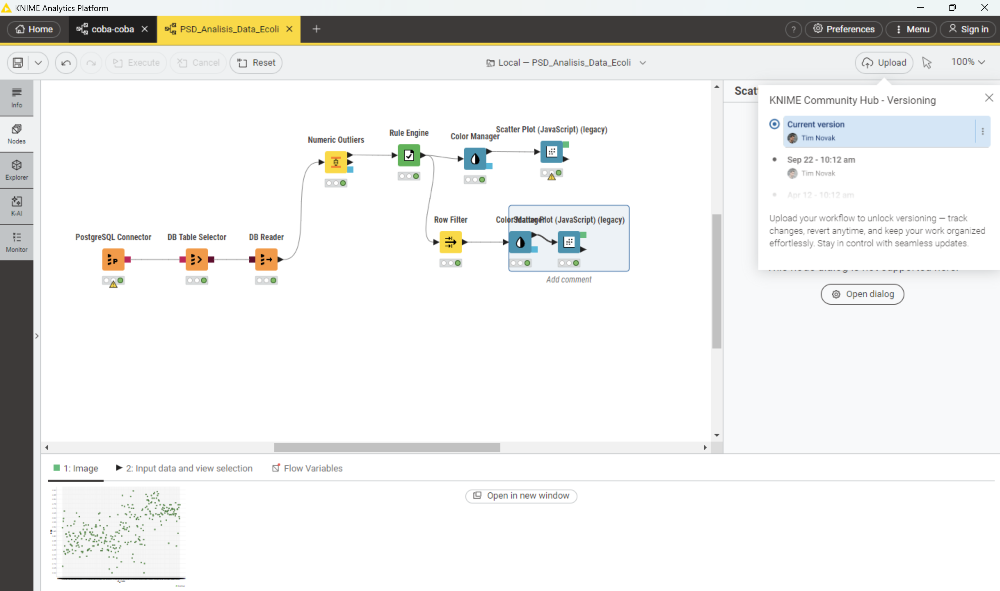

#### Missing Value Detection Menggunakan Tools KNIME

Langkah-langkah untuk deteksi missing value menggunakan tools KNIME

1. Tambahkan node Statistics dan sambungkan pada node untuk membaca data dari database atau mengquery data.

2. Jalankan node dan lihat output dengan cara klik kanan -> open output port -> nominal histogram table -> statistics.

Output yang dihasilkan dari deteksi missing value data Ecoli:
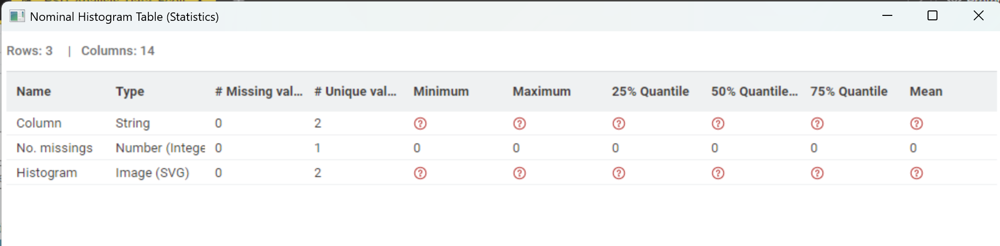

Berdasarkan tabel tersebut dapat disimpulkan bahwa data Ecoli tidak memiliki missing value.

Gambar node untuk mendeteksi missing value:
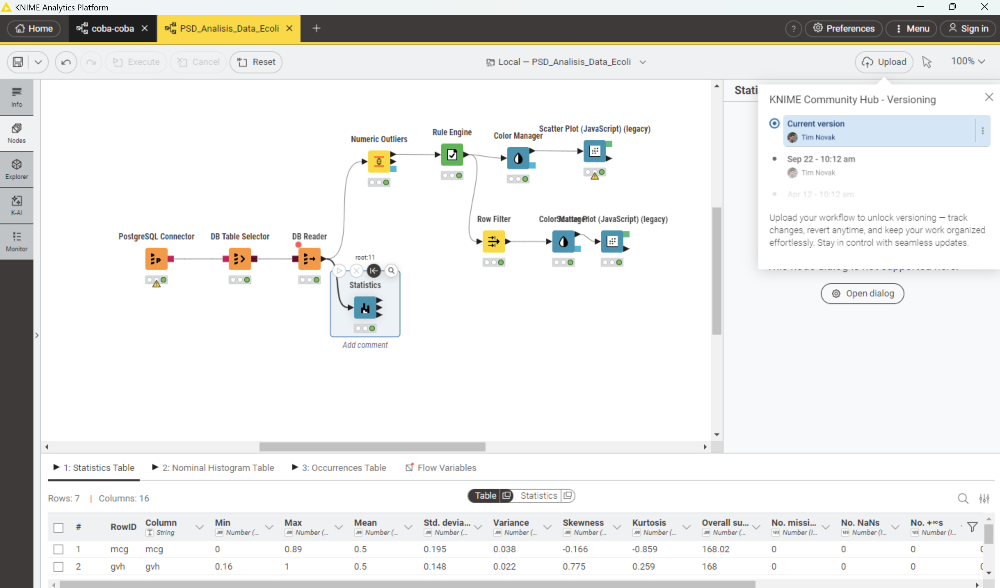

#### Deteksi Imbalancing Data dan Balancing Menggunakan

##### Deteksi Imbalancing

1. Tambahkan node Value Counter dan sambungkan dengan node DB Reader yang menangani query data dari database.

2. Pilih Value yang akan di hitung pada menu column di navbar kanan dan pilih "Class":

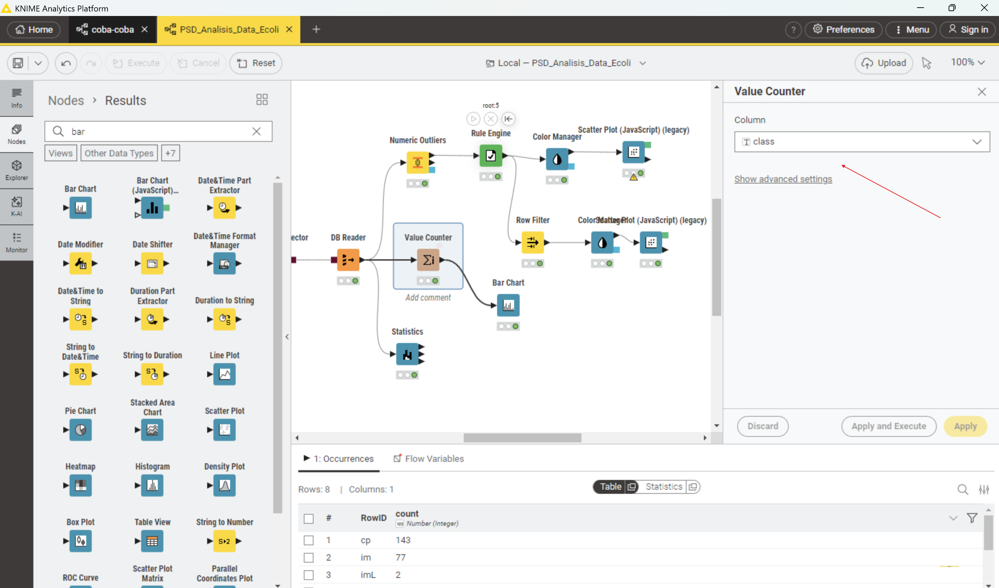

3. Tambahkan node Bar Chart untuk visualisasi jumlah datanya.


4. Pada Konfigurasi Bar Chart, ubah Kategori dari exclude menjadi include:

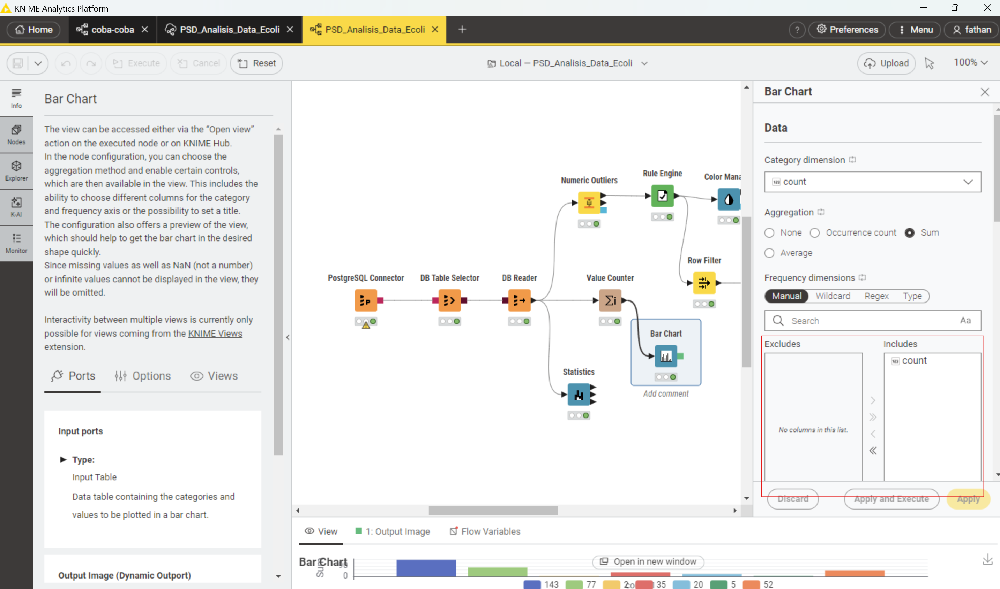

5. Jalankan node Bar Chart dan hasilnya seperti berikut:

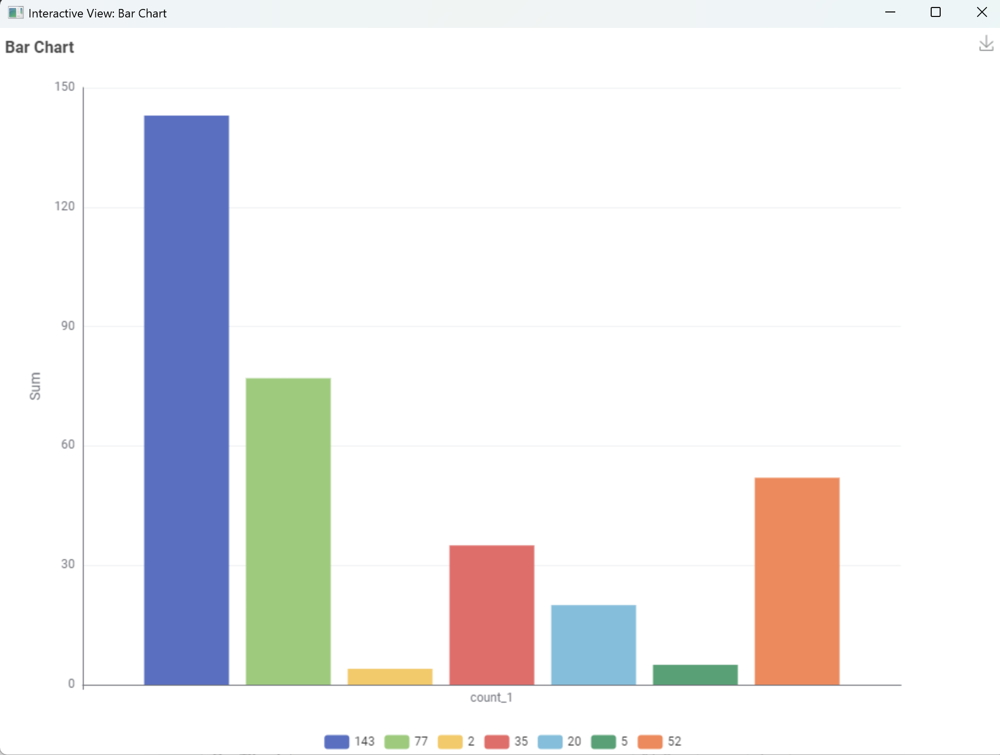

##### Balancing Menggunakan Python Script

1. Atur environment python yang sudah dibuat sebelumnya pada menu preference -> python -> conda -> dan pilih env yang sudah dibuat sebelumnya.

2. Apabila menggunakan node, tambahkan node Smote dan sambungkan dengan node DB Reader.

3. Kemudian atur untuk jumlah tetangga dan model bekerja pada kelas minor atau mayor, seperti pada gambar berikut:
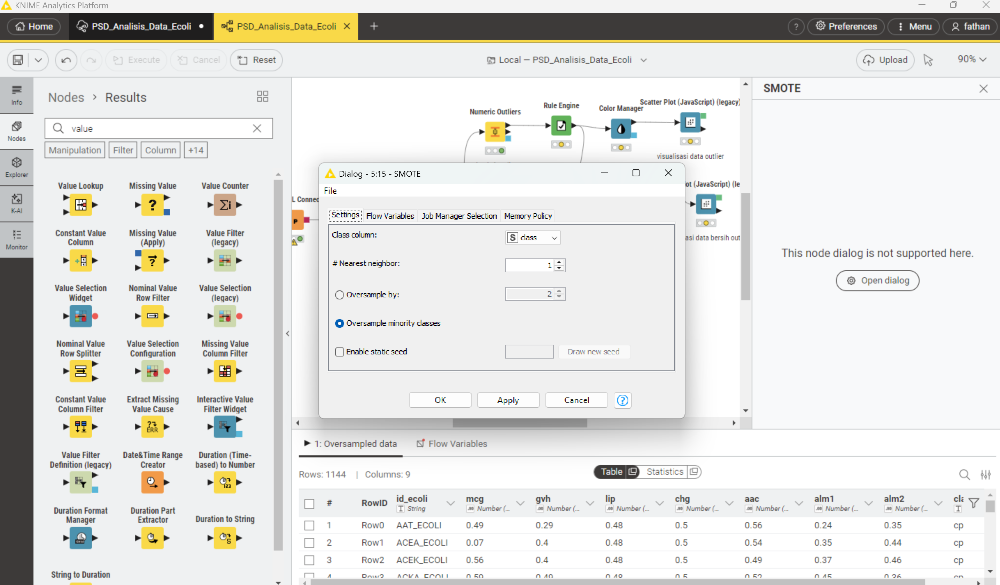

4. Klik "Apply" untuk menyimpan dan tambahkan node Value Counter seperti sebelumnya

5. Tambahkan Bar Chart juga seperti pada contoh sebelumnya.

Berikut merupakan hasil visualisasi balancing menggunakan SMOTE:
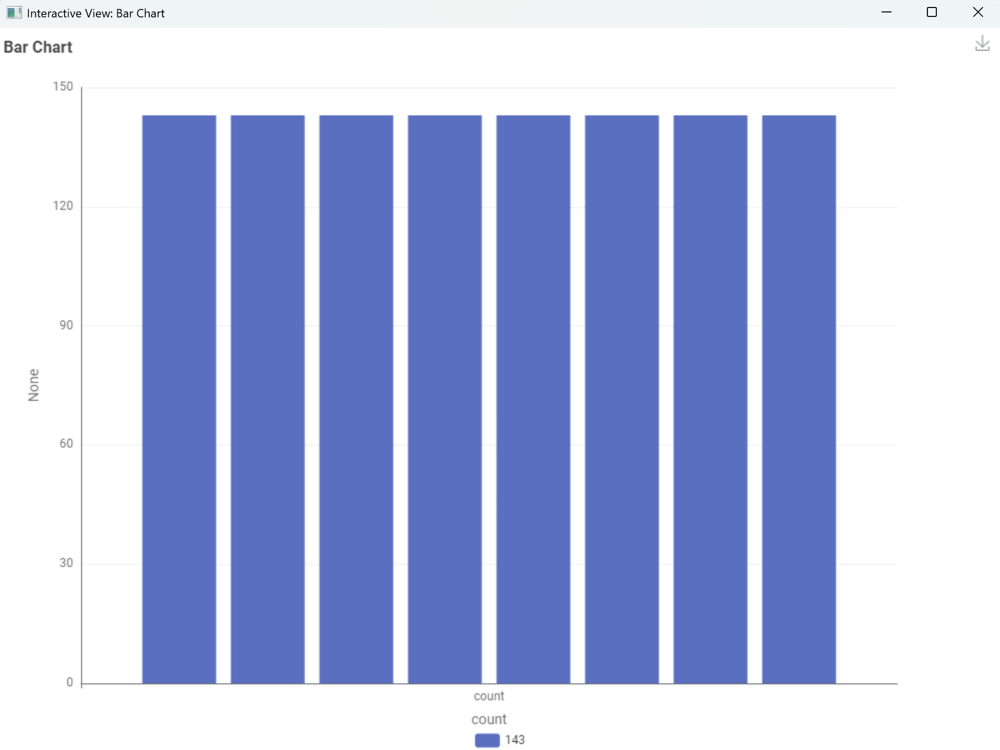

#### Tampilan Kumpulan Node Analisis Data Menggunakan KNIME

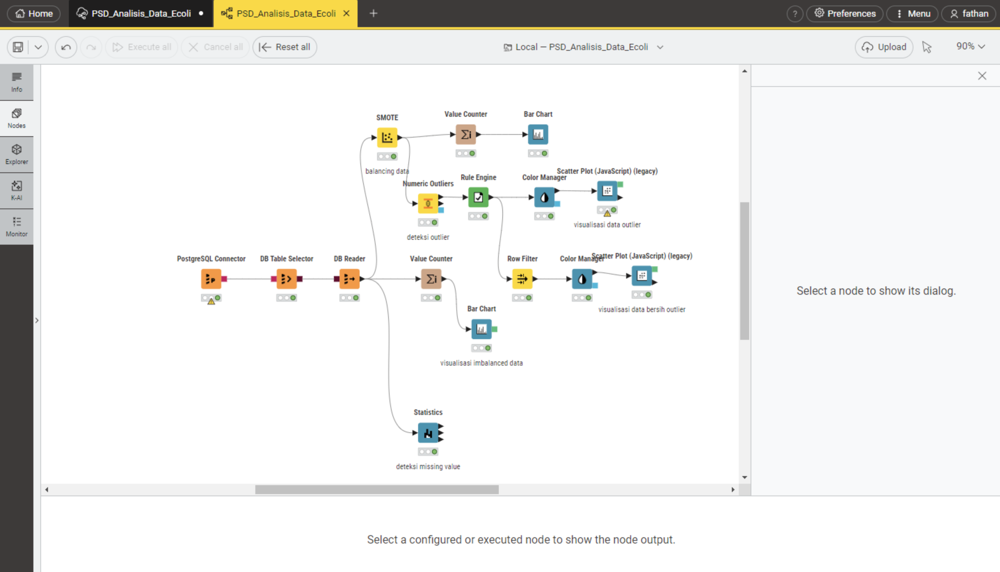

## Workflow KNIME

Berikut merupakan linknya : https://hub.knime.com/s/TDWiNl9Nysd3cf_1